<a href="https://colab.research.google.com/github/vonlanot/los-angeles-crimes/blob/main/LA_Crime_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [29]:
# --- Load data using Pandas
import pandas as pd
from google.colab import drive
import io

# --- Mount Google Drive
drive.mount('/content/drive')
print("Google Drive mounted.")

# --- Define path of the data
file_path = '/content/drive/MyDrive/Colab Notebooks/My Data/Crime_Data_from_2020_to_Present.csv'
print(f"\nAttempting to load file from: {file_path}")
try:
    df = pd.read_csv(file_path)
    print(f"'{file_path}' successfully loaded into DataFrame.")
except FileNotFoundError:
    print(f"Error: File not found at '{file_path}'. Please check the path and filename carefully.")
    df = None
except Exception as e:
    print(f"An error occurred while reading the CSV: {e}")
    df = None


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted.

Attempting to load file from: /content/drive/MyDrive/Colab Notebooks/My Data/Crime_Data_from_2020_to_Present.csv
'/content/drive/MyDrive/Colab Notebooks/My Data/Crime_Data_from_2020_to_Present.csv' successfully loaded into DataFrame.


In [30]:
# --- Initial data inspection
if df is not None:
    print("\nFirst 5 rows of the DataFrame:")
    print(df.head())
    print("\nDataFrame Info:")
    df.info()
    print("\nMissing values in each column:")
    print(df.isnull().sum())


First 5 rows of the DataFrame:
       DR_NO               Date Rptd                DATE OCC  TIME OCC  AREA  \
0  190326475  03/01/2020 12:00:00 AM  03/01/2020 12:00:00 AM      2130     7   
1  200106753  02/09/2020 12:00:00 AM  02/08/2020 12:00:00 AM      1800     1   
2  200320258  11/11/2020 12:00:00 AM  11/04/2020 12:00:00 AM      1700     3   
3  200907217  05/10/2023 12:00:00 AM  03/10/2020 12:00:00 AM      2037     9   
4  200412582  09/09/2020 12:00:00 AM  09/09/2020 12:00:00 AM       630     4   

    AREA NAME  Rpt Dist No  Part 1-2  Crm Cd  \
0    Wilshire          784         1     510   
1     Central          182         1     330   
2   Southwest          356         1     480   
3    Van Nuys          964         1     343   
4  Hollenbeck          413         1     510   

                                Crm Cd Desc  ... Status   Status Desc  \
0                          VEHICLE - STOLEN  ...     AA  Adult Arrest   
1                     BURGLARY FROM VEHICLE  ...    

In [31]:
# --- DR_NO is a unique identifier, like an ID, and it might be better as a string (object) than an integer (int64).
# --- AREA and Rpt Dist No are numerical codes for location, and performing calculations on them (like averages) doesn't make sense.
# --- Part 1-2, Crm Cd, Mocodes, Premis Cd, Weapon Used Cd, Crm Cd 1-4 as object (string) or Categorical, these are all codes/classifications, not quantities.
# --- Adopt datetime64[ns] format for date and time.

import numpy as np # Ensure numpy is imported for pd.notna

print("--- Converting Date Columns ---")
# Use the identified format string for precise parsing
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], format="%m/%d/%Y %I:%M:%S %p", errors='coerce')
print("Column 'Date Rptd' converted to datetime.")

df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], format="%m/%d/%Y %I:%M:%S %p", errors='coerce')
print("Column 'DATE OCC' converted to datetime.")

# Convert 'TIME OCC' to timedelta
# Corrected: Changed 'H' to 'h' and 'M' to 'min' as per Pandas' deprecation warnings/errors
df['TIME OCC'] = pd.to_numeric(df['TIME OCC'], errors='coerce') # Ensure it's numeric
df['TIME OCC'] = df['TIME OCC'].apply(
    lambda x: pd.to_timedelta(int(x // 100), unit='h') + pd.to_timedelta(int(x % 100), unit='min')
    if pd.notna(x) else pd.NaT # Handle NaNs
)
print("Column 'TIME OCC' converted to timedelta.")


print("\n--- Converting Categorical Columns ---")
categorical_cols_to_convert = [
    'DR_NO',         # From int64, now string (object) first, then category
    'AREA',          # From int64, now string (object) first, then category
    'AREA NAME',     # From object
    'Rpt Dist No',   # From int64, now string (object) first, then category
    'Part 1-2',      # From int64, now string (object) first, then category
    'Crm Cd',        # From int64, now string (object) first, then category
    'Crm Cd Desc',   # From object
    'Vict Sex',      # From object
    'Vict Descent',  # From object
    'Premis Cd',     # From float64, now string (object) first, then category
    'Premis Desc',   # From object
    'Weapon Used Cd',# From float64, now string (object) first, then category
    'Weapon Desc',   # From object
    'Status',        # From object
    'Status Desc',   # From object
    'Crm Cd 1',      # From float64, now string (object) first, then category
    'Crm Cd 2',      # From float64, now string (object) first, then category
    'Crm Cd 3',      # From float64, now string (object) first, then category
    'Crm Cd 4'       # From float64, now string (object) first, then category
]

for col in categorical_cols_to_convert:
    if col in df.columns: # Safety check
        # Convert to string first to handle NaNs and then to category
        df[col] = df[col].astype(str).astype('category')
        print(f"Column '{col}' converted to category.")
    else:
        print(f"Warning: Column '{col}' not found in DataFrame.")

# Fill NaNs in 'Mocodes' and 'Cross Street' and convert to category
if 'Mocodes' in df.columns:
    df['Mocodes'] = df['Mocodes'].fillna('NO_MOCODES').astype('category')
    print("Column 'Mocodes' filled NaNs and converted to category.")
if 'Cross Street' in df.columns:
    df['Cross Street'] = df['Cross Street'].fillna('NO_CROSS_STREET').astype('category')
    print("Column 'Cross Street' filled NaNs and converted to category.")


# Rename 'nan' categories to 'NOT_SPECIFIED' in specific columns
cols_to_rename_nan = ['Vict Sex', 'Vict Descent', 'Premis Desc', 'Weapon Desc', 'Status',
                      'Crm Cd Desc', 'AREA NAME'] # Add other relevant object/category columns if needed

for col in cols_to_rename_nan:
    if col in df.columns and pd.api.types.is_categorical_dtype(df[col]):
        # Check if 'nan' string actually exists in categories
        if 'nan' in df[col].cat.categories:
            new_categories = list(df[col].cat.categories)
            new_categories[new_categories.index('nan')] = 'NOT_SPECIFIED'
            df[col] = df[col].cat.rename_categories(new_categories)
            print(f"Renamed 'nan' category to 'NOT_SPECIFIED' in '{col}'.")
    elif col in df.columns and df[col].dtype == 'object':
        # If it's still an object dtype, fill NaNs explicitly if they appear as 'nan' strings
        # This is less likely if astype(str) is already run, but good for robustness
        df[col] = df[col].replace('nan', 'NOT_SPECIFIED')
        print(f"Replaced 'nan' string with 'NOT_SPECIFIED' in '{col}'.")


print("\n--- Verifying Data Types After Conversion ---")
df.info()

print("\n--- First 5 rows to check date formats and new categories ---")
print(df[['Date Rptd', 'DATE OCC', 'TIME OCC', 'Crm Cd Desc', 'AREA NAME', 'Vict Sex', 'Weapon Desc']].head())


--- Converting Date Columns ---
Column 'Date Rptd' converted to datetime.
Column 'DATE OCC' converted to datetime.
Column 'TIME OCC' converted to timedelta.

--- Converting Categorical Columns ---
Column 'DR_NO' converted to category.
Column 'AREA' converted to category.
Column 'AREA NAME' converted to category.
Column 'Rpt Dist No' converted to category.
Column 'Part 1-2' converted to category.
Column 'Crm Cd' converted to category.
Column 'Crm Cd Desc' converted to category.
Column 'Vict Sex' converted to category.
Column 'Vict Descent' converted to category.
Column 'Premis Cd' converted to category.
Column 'Premis Desc' converted to category.
Column 'Weapon Used Cd' converted to category.
Column 'Weapon Desc' converted to category.
Column 'Status' converted to category.
Column 'Status Desc' converted to category.
Column 'Crm Cd 1' converted to category.
Column 'Crm Cd 2' converted to category.
Column 'Crm Cd 3' converted to category.
Column 'Crm Cd 4' converted to category.
Column '

<ipython-input-31-936af92799a6>:71: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if col in df.columns and pd.api.types.is_categorical_dtype(df[col]):


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1005101 entries, 0 to 1005100
Data columns (total 28 columns):
 #   Column          Non-Null Count    Dtype          
---  ------          --------------    -----          
 0   DR_NO           1005101 non-null  category       
 1   Date Rptd       1005101 non-null  datetime64[ns] 
 2   DATE OCC        1005101 non-null  datetime64[ns] 
 3   TIME OCC        1005101 non-null  timedelta64[ns]
 4   AREA            1005101 non-null  category       
 5   AREA NAME       1005101 non-null  category       
 6   Rpt Dist No     1005101 non-null  category       
 7   Part 1-2        1005101 non-null  category       
 8   Crm Cd          1005101 non-null  category       
 9   Crm Cd Desc     1005101 non-null  category       
 10  Mocodes         1005101 non-null  category       
 11  Vict Age        1005101 non-null  int64          
 12  Vict Sex        1005101 non-null  category       
 13  Vict Descent    1005101 non-null  category       
 14  Pr

In [32]:
# --- Check for missing values

print("--- Checking for Missing Values in DataFrame ---")
missing_values_count = df.isnull().sum()
print(missing_values_count[missing_values_count > 0]) # Only print columns that have missing values

if missing_values_count.sum() == 0:
    print("\nGreat! No missing values found in any column. Your data is clean!")
else:
    print("\nSome columns still contain missing values. Review the list above.")

print("\n--- Missing Value Check Complete ---")

--- Checking for Missing Values in DataFrame ---
Series([], dtype: int64)

Great! No missing values found in any column. Your data is clean!

--- Missing Value Check Complete ---


In [33]:
# --- Filter data to exclude incomplete years (2024 - 2025)
print("--- Filtering Data to Exclude Incomplete Years (2024 & 2025) ---")

# Define the cutoff date
cutoff_date = pd.to_datetime('2023-12-31')

# Filter the DataFrame
df_filtered = df[df['DATE OCC'] <= cutoff_date].copy()

print(f"Original DataFrame size: {len(df)} rows")
print(f"Filtered DataFrame size (up to 2023-12-31): {len(df_filtered)} rows")

# Reassign df to the filtered DataFrame for all subsequent analysis
df = df_filtered

print("\nData filtered. All subsequent analyses will use data up to December 31, 2023.")

--- Filtering Data to Exclude Incomplete Years (2024 & 2025) ---
Original DataFrame size: 1005101 rows
Filtered DataFrame size (up to 2023-12-31): 877327 rows

Data filtered. All subsequent analyses will use data up to December 31, 2023.


In [34]:
# Identify the most common types of crimes reported in Los Angeles.

print("--- Identifying Most Common Crime Types ---")

# Calculate the value counts for the 'Crm Cd Desc' column
# This will give us the frequency of each crime description
most_common_crimes = df['Crm Cd Desc'].value_counts()

# Display the top 10 most common crime types
print("\nTop 10 Most Commonly Reported Crime Types in Los Angeles:")
print(most_common_crimes.head(10))

# Optionally, display the percentage distribution as well
print("\nTop 10 Most Commonly Reported Crime Types (with percentage):")
print((most_common_crimes.head(10) / len(df) * 100).round(2).astype(str) + '%')

print("\n--- Crime Type Identification Complete ---")

--- Identifying Most Common Crime Types ---

Top 10 Most Commonly Reported Crime Types in Los Angeles:
Crm Cd Desc
VEHICLE - STOLEN                                           93674
BATTERY - SIMPLE ASSAULT                                   69421
THEFT OF IDENTITY                                          56216
BURGLARY FROM VEHICLE                                      53990
BURGLARY                                                   53411
VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)    53141
ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT             49828
THEFT PLAIN - PETTY ($950 & UNDER)                         44899
INTIMATE PARTNER - SIMPLE ASSAULT                          43717
THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)            33702
Name: count, dtype: int64

Top 10 Most Commonly Reported Crime Types (with percentage):
Crm Cd Desc
VEHICLE - STOLEN                                           10.68%
BATTERY - SIMPLE ASSAULT                                    7.91%
THE

In [35]:
# Analyze trends over time

import pandas as pd

print("--- Analyzing Crime Trends Over Time ---")

# Extract Year, Quarter, and Month
df['OCC_YEAR'] = df['DATE OCC'].dt.year
df['OCC_QUARTER'] = df['DATE OCC'].dt.quarter
df['OCC_MONTH'] = df['DATE OCC'].dt.month

print("\n--- Yearly Crime Trends ---")
yearly_trends = df['OCC_YEAR'].value_counts().sort_index()
print(yearly_trends)

print("\n--- Quarterly Crime Trends (by Year and Quarter) ---")
# Group by year and then quarter to see quarterly patterns within each year
quarterly_trends = df.groupby(['OCC_YEAR', 'OCC_QUARTER']).size().reset_index(name='Crime_Count')
print(quarterly_trends)

print("\n--- Monthly Crime Trends (Overall - useful for seasonality) ---")
# Group by month number to see overall monthly seasonality
monthly_trends_overall = df['OCC_MONTH'].value_counts().sort_index()
print(monthly_trends_overall)

# To see monthly trends per year (more detailed)
print("\n--- Monthly Crime Trends (by Year and Month) ---")
monthly_trends_by_year = df.groupby(['OCC_YEAR', 'OCC_MONTH']).size().reset_index(name='Crime_Count')
print(monthly_trends_by_year)

print("\n--- Crime Trend Analysis Complete ---")

--- Analyzing Crime Trends Over Time ---

--- Yearly Crime Trends ---
OCC_YEAR
2020    199847
2021    209876
2022    235258
2023    232346
Name: count, dtype: int64

--- Quarterly Crime Trends (by Year and Quarter) ---
    OCC_YEAR  OCC_QUARTER  Crime_Count
0       2020            1        52048
1       2020            2        49996
2       2020            3        49718
3       2020            4        48085
4       2021            1        48430
5       2021            2        50293
6       2021            3        55474
7       2021            4        55679
8       2022            1        56062
9       2022            2        60577
10      2022            3        59494
11      2022            4        59125
12      2023            1        57674
13      2023            2        56588
14      2023            3        59337
15      2023            4        58747

--- Monthly Crime Trends (Overall - useful for seasonality) ---
OCC_MONTH
1     73750
2     68963
3     71501
4     7

--- Generating Monthly Crime Trends Graph by Year ---


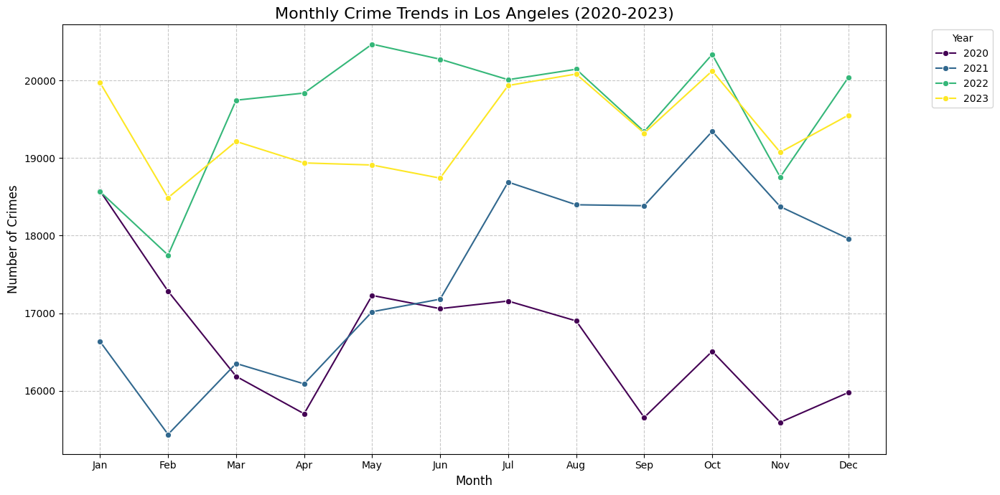


--- Monthly Crime Trends Graph Generated ---


In [36]:
# --- Chart trend data to check for patterns

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Make sure to have the 'monthly_trends_by_year' DataFrame

# df['OCC_YEAR'] = df['DATE OCC'].dt.year
# df['OCC_MONTH'] = df['DATE OCC'].dt.month
# monthly_trends_by_year = df.groupby(['OCC_YEAR', 'OCC_MONTH']).size().reset_index(name='Crime_Count')

# Define month names for better readability on the x-axis
month_names = [
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
]

print("--- Generating Monthly Crime Trends Graph by Year ---")

plt.figure(figsize=(14, 7)) # Adjust figure size for better readability

# Create the line plot using Seaborn
# 'x' is the month, 'y' is the crime count, 'hue' separates lines by year
sns.lineplot(
    data=monthly_trends_by_year,
    x='OCC_MONTH',
    y='Crime_Count',
    hue='OCC_YEAR',
    marker='o', # Add markers for each month
    palette='viridis' # Choose a color palette
)

# Add title and labels
plt.title('Monthly Crime Trends in Los Angeles (2020-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Crimes', fontsize=12)

# Set x-axis ticks to show all 12 months and label them with names
plt.xticks(ticks=range(1, 13), labels=month_names, fontsize=10)
plt.yticks(fontsize=10)

# Add a legend
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left') # Place legend outside the plot

# Add a grid for easier reading of values
plt.grid(True, linestyle='--', alpha=0.7)

# Improve layout to prevent labels from overlapping
plt.tight_layout()

# Display the plot
plt.show()

print("\n--- Monthly Crime Trends Graph Generated ---")

In [37]:
# --- Investigate the geographical distribution of crimes to identify high-incidence areas.

import pandas as pd

print("--- Investigating Geographical Distribution of Crimes by Area ---")

# Count the number of crimes per 'AREA NAME'
# Value_counts() will sort them in descending order by default
crime_by_area = df['AREA NAME'].value_counts()

# Display the top 15 areas with the highest crime incidence
print("\nTop 15 High-Incidence Crime Areas in Los Angeles (by AREA NAME):")
print(crime_by_area.head(15))

# Optionally, display these as percentages of total crimes
print("\nTop 15 High-Incidence Crime Areas (Percentage of Total Crimes):")
total_crimes = len(df)
print((crime_by_area.head(15) / total_crimes * 100).round(2).astype(str) + '%')

print("\n--- Geographical Distribution Analysis Complete ---")

--- Investigating Geographical Distribution of Crimes by Area ---

Top 15 High-Incidence Crime Areas in Los Angeles (by AREA NAME):
AREA NAME
Central        59456
77th Street    54981
Pacific        51351
Southwest      49127
Hollywood      46277
Southeast      44325
Olympic        44300
N Hollywood    43857
Newton         43787
Wilshire       41933
Rampart        41223
West LA        40313
Northeast      37703
Van Nuys       37122
West Valley    36863
Name: count, dtype: int64

Top 15 High-Incidence Crime Areas (Percentage of Total Crimes):
AREA NAME
Central        6.78%
77th Street    6.27%
Pacific        5.85%
Southwest       5.6%
Hollywood      5.27%
Southeast      5.05%
Olympic        5.05%
N Hollywood     5.0%
Newton         4.99%
Wilshire       4.78%
Rampart         4.7%
West LA        4.59%
Northeast       4.3%
Van Nuys       4.23%
West Valley     4.2%
Name: count, dtype: object

--- Geographical Distribution Analysis Complete ---


In [38]:
# --- Create heatmap to verify visually areas with high incidence of crimes
import pandas as pd
import folium
from folium.plugins import HeatMap

# Ensure 'LAT' and 'LON' columns are clean and numerical.
# We'll filter out any potential NaN values in LAT/LON just in case.

print("--- Generating Geographical Heatmap of Crimes (Adjusted Size) ---") # Updated print message

# Filter out rows with invalid or missing Lat/Lon if any still exist
# Folium HeatMap expects numerical data.
df_map_data = df.dropna(subset=['LAT', 'LON'])

# Filter out potential outlier coordinates (e.g., (0,0) or outside reasonable LA bounds)
# LA Latitude range: ~33 to ~35
# LA Longitude range: ~-119 to ~-117
df_map_data = df_map_data[
    (df_map_data['LAT'] >= 33.5) & (df_map_data['LAT'] <= 34.8) &
    (df_map_data['LON'] >= -118.9) & (df_map_data['LON'] <= -117.5)
]

print(f"Number of crime entries for heatmap: {len(df_map_data)}")

# Prepare data for HeatMap plugin: list of lists [latitude, longitude]
# For a basic heatmap, we just need the coordinates.
# If we want to weight crimes (e.g., by severity), we could add a third value [lat, lon, weight]
heat_data = [[row['LAT'], row['LON']] for index, row in df_map_data.iterrows()]

# Define the central coordinates for Los Angeles
la_center_lat = 34.0522
la_center_lon = -118.2437

# Create a Folium map centered on Los Angeles with adjusted dimensions
crime_map = folium.Map(
    location=[la_center_lat, la_center_lon],
    zoom_start=10, # Adjust zoom level to see the city
    control_scale=True, # Add a scale bar
    width='60%',   # Set the width of the map display to 60% of the notebook cell
    height='500px' # Set a fixed height, which works well with percentage widths
)

# Add the HeatMap layer to the map
# min_opacity: Minimum opacity of the heatmap points.
# max_zoom: Zoom level where the points will start to spread out.
# radius: Size of the individual "blur" around each point.
# blur: How much to blur the points.
# gradient: Color gradient for the heatmap.
HeatMap(heat_data, radius=10, blur=15, max_zoom=1, min_opacity=0.3).add_to(crime_map)

# Display the map (in a Colab notebook, this will render the interactive map directly)
print("\nInteractive crime heatmap generated below with adjusted size:") # Updated print message
crime_map

--- Generating Geographical Heatmap of Crimes (Adjusted Size) ---
Number of crime entries for heatmap: 875087

Interactive crime heatmap generated below with adjusted size:


In [39]:
# Check the range and quality of the data on age

import pandas as pd

print("--- Checking Range and Quality of 'Vict Age' Data ---")

# 1. Get descriptive statistics for 'Vict Age'
print("\nDescriptive Statistics for 'Vict Age':")
print(df['Vict Age'].describe())

# 2. Check value counts for the lowest ages to spot invalid entries (e.g., 0, -1)
print("\nValue Counts for Lowest Victim Ages:")
# We'll filter for values less than a reasonable minimum (e.g., 1)
# and also show the very lowest ages if they exist.
lowest_ages = df[df['Vict Age'] <= 5]['Vict Age'].value_counts().sort_index()
if not lowest_ages.empty:
    print(lowest_ages)
else:
    print("No victim ages 5 or less found.")

# 3. Check value counts for the highest ages to spot potential data entry errors (e.g., very high ages)
print("\nValue Counts for Highest Victim Ages:")
# Show ages above a reasonable maximum (e.g., 90)
highest_ages = df[df['Vict Age'] >= 90]['Vict Age'].value_counts().sort_index(ascending=False)
if not highest_ages.empty:
    print(highest_ages.head(10)) # Show top 10 highest if many unique very high ages
else:
    print("No victim ages 90 or more found.")

# 4. Quantify specific 'invalid' entries
invalid_age_count = df[df['Vict Age'] <= 0].shape[0]
print(f"\nNumber of entries with invalid or unspecified age (<= 0): {invalid_age_count}")

# 5. Check for NaN values in 'Vict Age' if not already confirmed
nan_age_count = df['Vict Age'].isnull().sum()
print(f"Number of explicit NaN values in 'Vict Age': {nan_age_count}")

print("\n--- 'Vict Age' Data Quality Check Complete ---")

--- Checking Range and Quality of 'Vict Age' Data ---

Descriptive Statistics for 'Vict Age':
count    877327.000000
mean         29.710703
std          21.813810
min          -4.000000
25%           3.000000
50%          31.000000
75%          45.000000
max         120.000000
Name: Vict Age, dtype: float64

Value Counts for Lowest Victim Ages:
Vict Age
-4         3
-3         6
-2        28
-1        99
 0    218449
 2       398
 3       464
 4       473
 5       529
Name: count, dtype: int64

Value Counts for Highest Victim Ages:
Vict Age
120      1
99     310
98      68
97      64
96      90
95      93
94      97
93     115
92     162
91     214
Name: count, dtype: int64

Number of entries with invalid or unspecified age (<= 0): 218585
Number of explicit NaN values in 'Vict Age': 0

--- 'Vict Age' Data Quality Check Complete ---


In [40]:
# Handle invalid or unknown victim ages (<= 0) by assigning them an 'Unknown/Not Recorded' category.
import pandas as pd

print("--- Preparing 'Vict Age' for Analysis: Handling Invalid/Unknown Ages ---")

# Create a new column 'Vict Age for Analysis' to work with, initializing it with original 'Vict Age'
df['Vict Age for Analysis'] = df['Vict Age']

# Replace invalid ages (0 or negative) with a specific placeholder string
# This is crucial for separating them from valid age groups.
df.loc[df['Vict Age for Analysis'] <= 0, 'Vict Age for Analysis'] = 'Unknown/Not Recorded'

# Verify the change by checking value counts of the new column, especially around the placeholder
print("\nValue Counts for 'Vict Age for Analysis' after handling invalid entries:")
print(df['Vict Age for Analysis'].value_counts().head()) # Show top values, including 'Unknown' if it's high

print("\nSmallest values in 'Vict Age for Analysis' (to ensure negatives/zeros are gone):")
# Filter and sort to confirm lowest valid numbers
# Ensure to convert to numeric first, coercing errors, then drop NaN
temp_ages = df[df['Vict Age for Analysis'] != 'Unknown/Not Recorded']['Vict Age for Analysis'].astype(float)
if not temp_ages.empty:
    print(temp_ages.min())
else:
    print("No valid ages found after filtering unknown/not recorded.")


print("\n--- 'Vict Age' Preparation Complete ---")

--- Preparing 'Vict Age' for Analysis: Handling Invalid/Unknown Ages ---

Value Counts for 'Vict Age for Analysis' after handling invalid entries:
Vict Age for Analysis
Unknown/Not Recorded    218585
30                       19965
35                       19564
31                       19076
29                       19055
Name: count, dtype: int64

Smallest values in 'Vict Age for Analysis' (to ensure negatives/zeros are gone):


<ipython-input-40-9a097812fc76>:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Unknown/Not Recorded' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[df['Vict Age for Analysis'] <= 0, 'Vict Age for Analysis'] = 'Unknown/Not Recorded'


2.0

--- 'Vict Age' Preparation Complete ---


In [41]:
# Bin valid victim ages into predefined groups and count crimes per group.
import pandas as pd
import numpy as np # For numerical operations and NaN handling

# Ages <= 0 have been replaced with 'Unknown/Not Recorded'.

print("--- Analyzing Crime Incidents by Victim Age Group (Binning) ---")

# Step 1: Separate known ages from 'Unknown/Not Recorded'
df_known_ages = df[df['Vict Age for Analysis'] != 'Unknown/Not Recorded'].copy()

# Step 2: Convert 'Vict Age for Analysis' to numeric type for the known ages subset
# Use pd.to_numeric with errors='coerce' to turn any remaining non-numeric into NaN,
# though after the previous step, this should primarily convert strings to numbers.
df_known_ages['Vict Age Numeric'] = pd.to_numeric(df_known_ages['Vict Age for Analysis'], errors='coerce')

# Drop any rows where conversion failed (should be very few if previous step was thorough)
df_known_ages.dropna(subset=['Vict Age Numeric'], inplace=True)

# Step 3: Define age bins and labels for the valid numeric ages
# We'll use common age groups. Ensure bins cover the range of valid ages.
# Let's verify the actual min/max of df_known_ages['Vict Age Numeric'] for robust binning
min_valid_age = df_known_ages['Vict Age Numeric'].min()
max_valid_age = df_known_ages['Vict Age Numeric'].max()

# Adjust bins to ensure they cover the full known range, starting from 1
age_bins = [1, 12, 17, 24, 34, 44, 54, 64, 74, 84, int(max_valid_age) + 1] # Ensure max age is covered
age_labels = [
    '1-11 (Child)', '12-17 (Teen)', '18-24 (Young Adult)',
    '25-34 (Adult)', '35-44 (Adult)', '45-54 (Middle-aged)',
    '55-64 (Middle-aged)', '65-74 (Senior)', '75-84 (Elderly)', '85+ (Elderly)'
]

# Bin the 'Vict Age Numeric' column
df_known_ages['Vict Age Group'] = pd.cut(
    df_known_ages['Vict Age Numeric'],
    bins=age_bins,
    labels=age_labels,
    right=False,          # Interval includes the left edge, excludes the right edge
    include_lowest=True   # Include the lowest bin edge (1)
)

# Step 4: Count crimes per valid age group
crimes_by_valid_age_group = df_known_ages['Vict Age Group'].value_counts().sort_index()


# Step 5: Get the count for 'Unknown/Not Recorded' ages from the original (df) DataFrame
unknown_age_count = df[df['Vict Age for Analysis'] == 'Unknown/Not Recorded'].shape[0]

# Step 6: Combine results
# Create a new Series for the unknown count to concatenate
unknown_series = pd.Series({'Unknown/Not Recorded': unknown_age_count})
# Concatenate and sort (ensuring 'Unknown' appears at the end or top, depending on desired order)
crimes_by_age_group = pd.concat([crimes_by_valid_age_group, unknown_series])

print("\nCrime Counts by Victim Age Group (Including Unknown/Not Recorded):")
print(crimes_by_age_group)

# Step 7: Calculate percentages for all groups
total_crimes_age = crimes_by_age_group.sum()
percentages_by_age_group = (crimes_by_age_group / total_crimes_age * 100).round(2)
print("\nCrime Percentages by Victim Age Group:")
print(percentages_by_age_group.astype(str) + '%')

print("\n--- Victim Age Group Analysis Complete ---")

--- Analyzing Crime Incidents by Victim Age Group (Binning) ---

Crime Counts by Victim Age Group (Including Unknown/Not Recorded):
1-11 (Child)              6038
12-17 (Teen)             13540
18-24 (Young Adult)      71498
25-34 (Adult)           181912
35-44 (Adult)           150709
45-54 (Middle-aged)     104222
55-64 (Middle-aged)      75219
65-74 (Senior)           38436
75-84 (Elderly)          13181
85+ (Elderly)             3987
Unknown/Not Recorded    218585
dtype: int64

Crime Percentages by Victim Age Group:
1-11 (Child)             0.69%
12-17 (Teen)             1.54%
18-24 (Young Adult)      8.15%
25-34 (Adult)           20.73%
35-44 (Adult)           17.18%
45-54 (Middle-aged)     11.88%
55-64 (Middle-aged)      8.57%
65-74 (Senior)           4.38%
75-84 (Elderly)           1.5%
85+ (Elderly)            0.45%
Unknown/Not Recorded    24.91%
dtype: object

--- Victim Age Group Analysis Complete ---


--- Generating Bar Chart for Crime Incidents by Victim Age Group ---


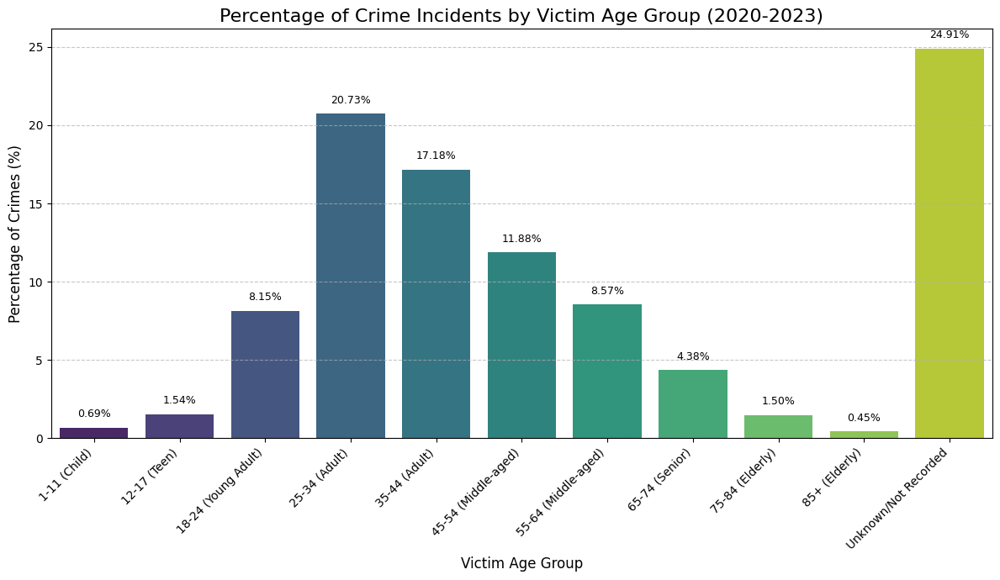


--- Bar Chart for Victim Age Group Analysis Generated ---


In [42]:
# Visualize the distribution of crime incidents across victim age groups using a bar chart.

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

print("--- Generating Bar Chart for Crime Incidents by Victim Age Group ---")

plt.figure(figsize=(12, 7)) # Adjust figure size for better readability

# Create a bar plot
# Updated: Assign the 'x' variable to 'hue' and set 'legend=False'
sns.barplot(
    x=percentages_by_age_group.index, # Age group labels on x-axis
    y=percentages_by_age_group.values, # Percentage values on y-axis
    hue=percentages_by_age_group.index, # Explicitly use x-axis categories for coloring
    palette='viridis', # Choose a visually appealing color palette
    legend=False # Suppress the redundant legend
)

# Add titles and labels
plt.title('Percentage of Crime Incidents by Victim Age Group (2020-2023)', fontsize=16)
plt.xlabel('Victim Age Group', fontsize=12)
plt.ylabel('Percentage of Crimes (%)', fontsize=12)

# Rotate x-axis labels for better readability if they overlap
plt.xticks(rotation=45, ha='right', fontsize=10) # 'ha' aligns text nicely

# Add percentages on top of the bars for exact values
for index, value in enumerate(percentages_by_age_group.values):
    plt.text(
        index,
        value + 0.5, # Position the text slightly above the bar
        f'{value:.2f}%', # Format to two decimal places
        ha='center', # Center the text horizontally
        va='bottom', # Align vertically at the bottom
        fontsize=9
    )

# Add a grid for easier reading of values
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Improve layout to prevent labels/titles from overlapping
plt.tight_layout()

# Display the plot
plt.show()

print("\n--- Bar Chart for Victim Age Group Analysis Generated ---")

In [43]:
# Examine the distribution and quality of the 'Vict Sex' column.
import pandas as pd

# Assuming 'df' is your filtered DataFrame (up to 2023-12-31)

print("--- Checking Distribution of 'Vict Sex' Data ---")

# Get value counts for 'Vict Sex'
vict_sex_counts = df['Vict Sex'].value_counts(dropna=False) # dropna=False to check for any NaN values

print("\nValue Counts for 'Vict Sex':")
print(vict_sex_counts)

# Calculate percentages
total_vict_sex_entries = vict_sex_counts.sum()
vict_sex_percentages = (vict_sex_counts / total_vict_sex_entries * 100).round(2)

print("\nPercentages for 'Vict Sex':")
print(vict_sex_percentages.astype(str) + '%')

print("\n--- 'Vict Sex' Data Distribution Check Complete ---")

--- Checking Distribution of 'Vict Sex' Data ---

Value Counts for 'Vict Sex':
Vict Sex
M                360675
F                322447
NOT_SPECIFIED    115431
X                 78676
H                    97
-                     1
Name: count, dtype: int64

Percentages for 'Vict Sex':
Vict Sex
M                41.11%
F                36.75%
NOT_SPECIFIED    13.16%
X                 8.97%
H                 0.01%
-                  0.0%
Name: count, dtype: object

--- 'Vict Sex' Data Distribution Check Complete ---


In [44]:
# Consolidate 'X', 'H', and '-' categories in 'Vict Sex' into a single 'Unknown/Other' category, handling CategoricalDtype warning.
import pandas as pd

print("--- Consolidating 'Vict Sex' Categories ---")

# Create a copy of the 'Vict Sex' column and explicitly cast it to 'object' (string) dtype
# This prevents the FutureWarning when using .replace() on a CategoricalDtype column.
df['Vict Sex Cleaned'] = df['Vict Sex'].astype(object)

# Replace 'X', 'H', and '-' with 'Unknown/Other'
# We'll also re-map our existing 'NOT_SPECIFIED' to the new 'Unknown/Other' for full consolidation
df['Vict Sex Cleaned'] = df['Vict Sex Cleaned'].replace({
    'X': 'Unknown/Other',
    'H': 'Unknown/Other',
    '-': 'Unknown/Other',
    'NOT_SPECIFIED': 'Unknown/Other' # Consolidate our previous NOT_SPECIFIED here as well
})

# Verify the changes
vict_sex_cleaned_counts = df['Vict Sex Cleaned'].value_counts(dropna=False)
print("\nValue Counts for 'Vict Sex Cleaned' after consolidation:")
print(vict_sex_cleaned_counts)

# Calculate percentages for the cleaned column
total_vict_sex_cleaned_entries = vict_sex_cleaned_counts.sum()
vict_sex_cleaned_percentages = (vict_sex_cleaned_counts / total_vict_sex_cleaned_entries * 100).round(2)

print("\nPercentages for 'Vict Sex Cleaned':")
print(vict_sex_cleaned_percentages.astype(str) + '%')

print("\n--- 'Vict Sex' Consolidation Complete ---")

--- Consolidating 'Vict Sex' Categories ---

Value Counts for 'Vict Sex Cleaned' after consolidation:
Vict Sex Cleaned
M                360675
F                322447
Unknown/Other    194205
Name: count, dtype: int64

Percentages for 'Vict Sex Cleaned':
Vict Sex Cleaned
M                41.11%
F                36.75%
Unknown/Other    22.14%
Name: count, dtype: object

--- 'Vict Sex' Consolidation Complete ---


--- Generating Bar Chart for Crime Incidents by Victim Sex ---


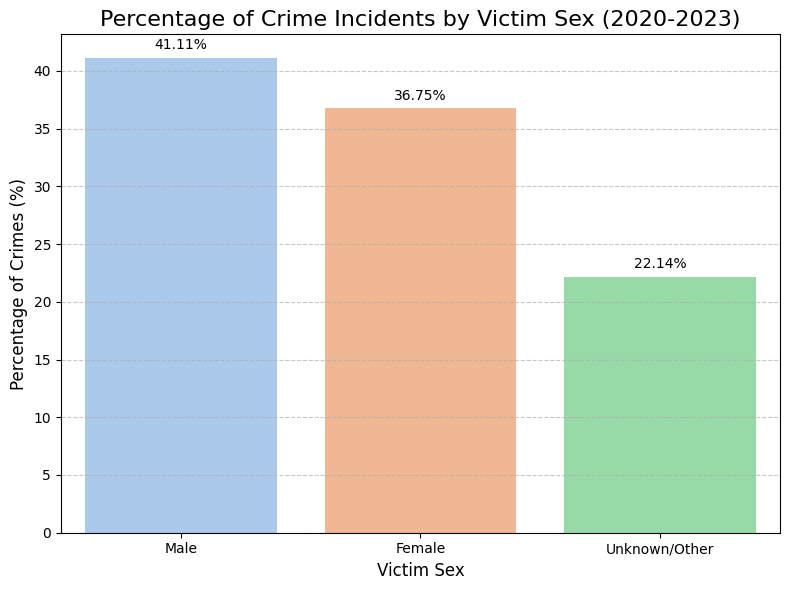


--- Bar Chart for Victim Sex Analysis Generated ---


In [45]:
# Visualize the distribution of crime incidents across victim sex categories with human-readable labels.

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd # Ensure pandas is imported if not already

print("--- Generating Bar Chart for Crime Incidents by Victim Sex ---")

# Create human-readable labels for the x-axis
# We'll map the current index values to the desired labels
human_readable_labels = [
    'Male' if label == 'M' else
    'Female' if label == 'F' else
    label # Keep 'Unknown/Other' as is
    for label in vict_sex_cleaned_percentages.index
]


plt.figure(figsize=(8, 6)) # Adjust figure size for better readability

# Create a bar plot
sns.barplot(
    x=human_readable_labels, # Use the new human-readable labels on x-axis
    y=vict_sex_cleaned_percentages.values, # Percentage values on y-axis
    hue=human_readable_labels, # Explicitly use new labels for coloring
    palette='pastel', # Choose a different palette for variety, or 'viridis' again
    legend=False # Suppress the redundant legend
)

# Add titles and labels
plt.title('Percentage of Crime Incidents by Victim Sex (2020-2023)', fontsize=16)
plt.xlabel('Victim Sex', fontsize=12)
plt.ylabel('Percentage of Crimes (%)', fontsize=12)

# No need to rotate x-axis labels as they are short and clear now

# Add percentages on top of the bars for exact values
for index, value in enumerate(vict_sex_cleaned_percentages.values):
    plt.text(
        index,
        value + 0.5, # Position the text slightly above the bar
        f'{value:.2f}%', # Format to two decimal places
        ha='center', # Center the text horizontally
        va='bottom', # Align vertically at the bottom
        fontsize=10
    )

# Add a grid for easier reading of values
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Improve layout
plt.tight_layout()

# Display the plot
plt.show()

print("\n--- Bar Chart for Victim Sex Analysis Generated ---")

In [46]:
# Examine the distribution and quality of the 'Vict Descent' column.
import pandas as pd

print("--- Checking Distribution of 'Vict Descent' Data ---")

# Get value counts for 'Vict Descent'
vict_descent_counts = df['Vict Descent'].value_counts(dropna=False) # dropna=False to check for any NaN values

print("\nValue Counts for 'Vict Descent':")
print(vict_descent_counts)

# Calculate percentages
total_vict_descent_entries = vict_descent_counts.sum()
vict_descent_percentages = (vict_descent_counts / total_vict_descent_entries * 100).round(2)

print("\nPercentages for 'Vict Descent':")
print(vict_descent_percentages.astype(str) + '%')

print("\n--- 'Vict Descent' Data Distribution Check Complete ---")

--- Checking Distribution of 'Vict Descent' Data ---

Value Counts for 'Vict Descent':
Vict Descent
H                267794
W                178473
B                124096
NOT_SPECIFIED    115439
X                 86676
O                 69458
A                 19247
K                  4796
F                  3754
C                  3477
J                  1236
V                   929
I                   839
Z                   452
P                   238
U                   175
D                    74
G                    64
L                    59
S                    49
-                     2
Name: count, dtype: int64

Percentages for 'Vict Descent':
Vict Descent
H                30.52%
W                20.34%
B                14.14%
NOT_SPECIFIED    13.16%
X                 9.88%
O                 7.92%
A                 2.19%
K                 0.55%
F                 0.43%
C                  0.4%
J                 0.14%
V                 0.11%
I                  0.1%
Z           

In [47]:
# Purpose: Consolidate specific victim descent codes into more granular categories, including separate Asian and Pacific Islander groups.

import pandas as pd

print("--- Consolidating 'Vict Descent' Categories ---")

# Create a new column for cleaned descent, ensuring it's an object dtype to avoid FutureWarnings
df['Vict Descent Cleaned'] = df['Vict Descent'].astype(object)

# Define the final revised mapping for consolidation
descent_mapping = {
    'H': 'Hispanic/Latin',
    'W': 'White',
    'B': 'Black',
    'I': 'American Indian/Alaska Native',

    # Asian Categories
    'A': 'Asian',
    'C': 'Asian', # Chinese
    'F': 'Asian', # Filipino
    'J': 'Asian', # Japanese
    'K': 'Asian', # Korean
    'L': 'Asian', # Laotian
    'V': 'Asian', # Vietnamese
    'Z': 'Asian', # Asian Indian
    'D': 'Asian', # Cambodian

    # Pacific Islander Categories
    'P': 'Pacific Islander',
    'G': 'Pacific Islander', # Guamanian
    'S': 'Pacific Islander', # Samoan
    'U': 'Pacific Islander', # Hawaiian

    # Unknown/Unspecified/Other
    'X': 'Unknown/Unspecified',
    'O': 'Unknown/Unspecified',
    'NOT_SPECIFIED': 'Unknown/Unspecified',
    '-': 'Unknown/Unspecified'
}

# Apply the mapping to the 'Vict Descent Cleaned' column
df['Vict Descent Cleaned'] = df['Vict Descent Cleaned'].replace(descent_mapping)

# Verify the changes
vict_descent_cleaned_counts = df['Vict Descent Cleaned'].value_counts(dropna=False)
print("\nValue Counts for 'Vict Descent Cleaned' after final revised consolidation:")
print(vict_descent_cleaned_counts)

# Calculate percentages for the cleaned column
total_vict_descent_cleaned_entries = vict_descent_cleaned_counts.sum()
# CORRECTED: Changed 'total_descent_cleaned_entries' to 'total_vict_descent_cleaned_entries'
vict_descent_cleaned_percentages = (vict_descent_cleaned_counts / total_vict_descent_cleaned_entries * 100).round(2)

print("\nPercentages for 'Vict Descent Cleaned':")
print(vict_descent_cleaned_percentages.astype(str) + '%')

print("\n--- 'Vict Descent' Consolidation Complete ---")

--- Consolidating 'Vict Descent' Categories ---

Value Counts for 'Vict Descent Cleaned' after final revised consolidation:
Vict Descent Cleaned
Unknown/Unspecified              271575
Hispanic/Latin                   267794
White                            178473
Black                            124096
Asian                             34024
American Indian/Alaska Native       839
Pacific Islander                    526
Name: count, dtype: int64

Percentages for 'Vict Descent Cleaned':
Vict Descent Cleaned
Unknown/Unspecified              30.95%
Hispanic/Latin                   30.52%
White                            20.34%
Black                            14.14%
Asian                             3.88%
American Indian/Alaska Native      0.1%
Pacific Islander                  0.06%
Name: count, dtype: object

--- 'Vict Descent' Consolidation Complete ---


--- Generating Bar Chart for Crime Incidents by Victim Descent (Unknown at End) ---


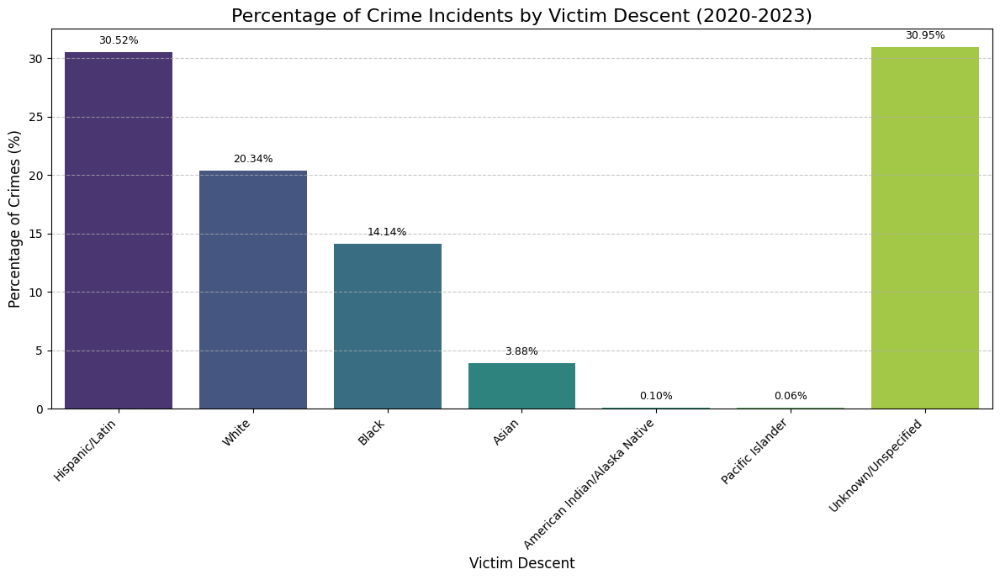


--- Bar Chart for Victim Descent Analysis Generated ---


In [48]:
# Purpose: Visualize the distribution of crime incidents by victim descent, with 'Unknown/Unspecified' at the end.
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd # Ensure pandas is imported if not already

# ASSUMPTION: 'vict_descent_cleaned_percentages' Series is available from the previous step.

print("--- Generating Bar Chart for Crime Incidents by Victim Descent (Unknown at End) ---")

# Separate 'Unknown/Unspecified'
# Using .get() with a default value (None) in case the category isn't there, though it should be.
unknown_percentage = vict_descent_cleaned_percentages.get('Unknown/Unspecified')
# Drop 'Unknown/Unspecified' to sort the rest
known_descent_percentages = vict_descent_cleaned_percentages.drop(labels=['Unknown/Unspecified'], errors='ignore')

# Sort the known descent percentages in descending order
known_descent_sorted = known_descent_percentages.sort_values(ascending=False)

# Combine sorted known categories with 'Unknown/Unspecified' at the very end
# Check if unknown_percentage is not None before concatenating a new Series for it
if unknown_percentage is not None:
    final_percentages = pd.concat([known_descent_sorted, pd.Series({'Unknown/Unspecified': unknown_percentage})])
else:
    final_percentages = known_descent_sorted # If 'Unknown' somehow wasn't found, just use the known sorted ones


plt.figure(figsize=(12, 7)) # Adjust figure size for better readability

# Create a bar plot
sns.barplot(
    x=final_percentages.index, # Descent categories on x-axis (with 'Unknown' at the end)
    y=final_percentages.values, # Percentage values on y-axis
    hue=final_percentages.index, # Explicitly use x-axis categories for coloring
    palette='viridis', # A good general-purpose color palette
    legend=False # Suppress the redundant legend
)

# Add titles and labels
plt.title('Percentage of Crime Incidents by Victim Descent (2020-2023)', fontsize=16)
plt.xlabel('Victim Descent', fontsize=12)
plt.ylabel('Percentage of Crimes (%)', fontsize=12)

# Rotate x-axis labels for better readability if they overlap
plt.xticks(rotation=45, ha='right', fontsize=10) # 'ha' aligns text nicely

# Add percentages on top of the bars for exact values
for index, value in enumerate(final_percentages.values):
    plt.text(
        index,
        value + 0.5, # Position the text slightly above the bar
        f'{value:.2f}%', # Format to two decimal places
        ha='center', # Center the text horizontally
        va='bottom', # Align vertically at the bottom
        fontsize=9
    )

# Add a grid for easier reading of values
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Improve layout to prevent labels/titles from overlapping
plt.tight_layout()

# Display the plot
plt.show()

print("\n--- Bar Chart for Victim Descent Analysis Generated ---")

In [49]:
# Examine the distribution and quality of the 'Premis Desc' column.

import pandas as pd

print("--- Checking Distribution of 'Premis Desc' Data ---")

# Get value counts for 'Premis Desc', including NaN values
premis_desc_counts = df['Premis Desc'].value_counts(dropna=False)

print("\nValue Counts for 'Premis Desc':")
print(premis_desc_counts)

# Calculate percentages
total_premis_desc_entries = premis_desc_counts.sum()
premis_desc_percentages = (premis_desc_counts / total_premis_desc_entries * 100).round(2)

print("\nPercentages for 'Premis Desc':")
print(premis_desc_percentages.astype(str) + '%')

print("\n--- 'Premis Desc' Data Distribution Check Complete ---")

--- Checking Distribution of 'Premis Desc' Data ---

Value Counts for 'Premis Desc':
Premis Desc
STREET                                          221329
SINGLE FAMILY DWELLING                          149227
MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)    107990
PARKING LOT                                      60827
OTHER BUSINESS                                   41479
                                                 ...  
MTA - SILVER LINE - DOWNTOWN STREET STOPS            2
SEWAGE FACILITY/PIPE                                 2
HORSE RACING/SANTA ANITA PARK*                       2
DEPT OF DEFENSE FACILITY                             2
TRAM/STREETCAR(BOXLIKE WAG ON RAILS)*                1
Name: count, Length: 307, dtype: int64

Percentages for 'Premis Desc':
Premis Desc
STREET                                          25.23%
SINGLE FAMILY DWELLING                          17.01%
MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)    12.31%
PARKING LOT                                      6

In [50]:
# Purpose: Consolidate 'Premis Desc' categories into a top N and an 'Other Premises' group.
import pandas as pd

# Assuming 'df' is your filtered DataFrame with 'Premis Desc' column
# And 'premis_desc_counts' is available from the previous value_counts() step

print("--- Consolidating 'Premis Desc' Categories ---")

# 1. Get the top 10 most frequent premise descriptions
top_n = 10
top_premises = premis_desc_counts.index[:top_n].tolist()

# 2. Create a new column for cleaned premise descriptions, ensuring it's an object dtype
df['Premis Desc Cleaned'] = df['Premis Desc'].astype(object)

# 3. Define a mapping to group all non-top categories into 'Other Premises'
# This lambda function checks if a premise is in our top_premises list.
# If it is, keep its original value; otherwise, classify it as 'Other Premises'.
# Also handle any blank strings by classifying them as 'Other Premises'.
df['Premis Desc Cleaned'] = df['Premis Desc Cleaned'].apply(
    lambda x: x if x in top_premises and x != '' else 'Other Premises'
)

# Verify the changes
premis_desc_cleaned_counts = df['Premis Desc Cleaned'].value_counts(dropna=False)
print("\nValue Counts for 'Premis Desc Cleaned' after consolidation:")
print(premis_desc_cleaned_counts)

# Calculate percentages for the cleaned column
total_premis_desc_cleaned_entries = premis_desc_cleaned_counts.sum()
premis_desc_cleaned_percentages = (premis_desc_cleaned_counts / total_premis_desc_cleaned_entries * 100).round(2)

print("\nPercentages for 'Premis Desc Cleaned':")
print(premis_desc_cleaned_percentages.astype(str) + '%')

print("\n--- 'Premis Desc' Consolidation Complete ---")

--- Consolidating 'Premis Desc' Categories ---

Value Counts for 'Premis Desc Cleaned' after consolidation:
Premis Desc Cleaned
STREET                                          221329
Other Premises                                  191031
SINGLE FAMILY DWELLING                          149227
MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)    107990
PARKING LOT                                      60827
OTHER BUSINESS                                   41479
SIDEWALK                                         37412
VEHICLE, PASSENGER/TRUCK                         25779
GARAGE/CARPORT                                   17015
DRIVEWAY                                         14114
RESTAURANT/FAST FOOD                             11124
Name: count, dtype: int64

Percentages for 'Premis Desc Cleaned':
Premis Desc Cleaned
STREET                                          25.23%
Other Premises                                  21.77%
SINGLE FAMILY DWELLING                          17.01%
MULTI-UNIT DWELL

--- Consolidating 'Premis Desc' Categories (Re-running Consolidation) ---

Value Counts for 'Premis Desc Cleaned' after consolidation:
Premis Desc Cleaned
STREET                                          221329
Other Premises                                  191031
SINGLE FAMILY DWELLING                          149227
MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)    107990
PARKING LOT                                      60827
OTHER BUSINESS                                   41479
SIDEWALK                                         37412
VEHICLE, PASSENGER/TRUCK                         25779
GARAGE/CARPORT                                   17015
DRIVEWAY                                         14114
RESTAURANT/FAST FOOD                             11124
Name: count, dtype: int64

Percentages for 'Premis Desc Cleaned':
Premis Desc Cleaned
STREET                                          25.23%
Other Premises                                  21.77%
SINGLE FAMILY DWELLING                      

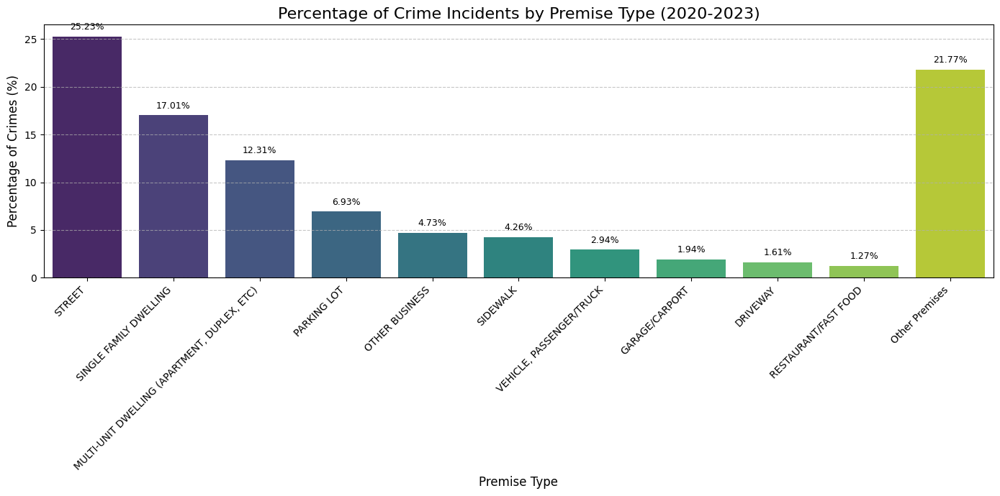


--- Bar Chart for Premise Description Analysis (Other at End) Generated ---


In [51]:
# Consolidate 'Premis Desc' categories and then visualize the distribution with 'Other Premises' at the end.
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# We need to make sure 'premis_desc_counts' is also available if it's used directly here,
# or recalculate it from df['Premis Desc']
print("--- Consolidating 'Premis Desc' Categories (Re-running Consolidation) ---")

# --- START CONSOLIDATION CODE (Ensuring variables are defined) ---
# Get initial value counts (re-running this to ensure premis_desc_counts is defined)
premis_desc_counts = df['Premis Desc'].value_counts(dropna=False)

# 1. Get the top 10 most frequent premise descriptions
top_n = 10
top_premises = premis_desc_counts.index[:top_n].tolist()

# 2. Create a new column for cleaned premise descriptions, ensuring it's an object dtype
df['Premis Desc Cleaned'] = df['Premis Desc'].astype(object)

# 3. Define a mapping to group all non-top categories into 'Other Premises'
df['Premis Desc Cleaned'] = df['Premis Desc Cleaned'].apply(
    lambda x: x if x in top_premises and x != '' else 'Other Premises'
)

# Verify the changes
premis_desc_cleaned_counts = df['Premis Desc Cleaned'].value_counts(dropna=False)
print("\nValue Counts for 'Premis Desc Cleaned' after consolidation:")
print(premis_desc_cleaned_counts)

# Calculate percentages for the cleaned column
total_premis_desc_cleaned_entries = premis_desc_cleaned_counts.sum()
premis_desc_cleaned_percentages = (premis_desc_cleaned_counts / total_premis_desc_cleaned_entries * 100).round(2)

print("\nPercentages for 'Premis Desc Cleaned':")
print(premis_desc_cleaned_percentages.astype(str) + '%')
print("--- 'Premis Desc' Consolidation Complete ---")

# --- END CONSOLIDATION CODE ---


print("\n--- Generating Bar Chart for Crime Incidents by Premise Description (Other at End) ---")

# Separate 'Other Premises'
other_premises_percentage = premis_desc_cleaned_percentages.get('Other Premises')
# Drop 'Other Premises' to sort the rest
specific_premises_percentages = premis_desc_cleaned_percentages.drop(labels=['Other Premises'], errors='ignore')

# Sort the specific premise percentages in descending order
specific_premises_sorted = specific_premises_percentages.sort_values(ascending=False)

# Combine sorted specific categories with 'Other Premises' at the very end
if other_premises_percentage is not None:
    final_premises_percentages = pd.concat([specific_premises_sorted, pd.Series({'Other Premises': other_premises_percentage})])
else:
    final_premises_percentages = specific_premises_sorted # If 'Other Premises' wasn't found (unlikely), just use the sorted ones

plt.figure(figsize=(14, 7)) # Adjust figure size for better readability, wider for more labels

# Create a bar plot
sns.barplot(
    x=final_premises_percentages.index, # Premise categories on x-axis
    y=final_premises_percentages.values, # Percentage values on y-axis
    hue=final_premises_percentages.index, # Explicitly use x-axis categories for coloring
    palette='viridis', # A good general-purpose color palette
    legend=False # Suppress the redundant legend
)

# Add titles and labels
plt.title('Percentage of Crime Incidents by Premise Type (2020-2023)', fontsize=16)
plt.xlabel('Premise Type', fontsize=12)
plt.ylabel('Percentage of Crimes (%)', fontsize=12)

# Rotate x-axis labels for better readability as they are long
plt.xticks(rotation=45, ha='right', fontsize=10) # 'ha' aligns text nicely

# Add percentages on top of the bars for exact values
for index, value in enumerate(final_premises_percentages.values):
    plt.text(
        index,
        value + 0.5, # Position the text slightly above the bar
        f'{value:.2f}%', # Format to two decimal places
        ha='center', # Center the text horizontally
        va='bottom', # Align vertically at the bottom
        fontsize=9
    )

# Add a grid for easier reading of values
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Improve layout to prevent labels/titles from overlapping
plt.tight_layout()

# Display the plot
plt.show()

print("\n--- Bar Chart for Premise Description Analysis (Other at End) Generated ---")

In [52]:
# Extract 'DAY OF WEEK' from 'DATE OCC' and then analyze its distribution.
import pandas as pd

print("--- Extracting 'DAY OF WEEK' and Checking Distribution ---")

# Extract the day of the week name and store it in a new column
# .dt.day_name() returns the full name of the day (e.g., 'Monday', 'Tuesday')
df['DAY OF WEEK'] = df['DATE OCC'].dt.day_name()

# Define a specific order for days of the week for consistent plotting
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert 'DAY OF WEEK' column to a categorical type with the specified order
df['DAY OF WEEK'] = pd.Categorical(df['DAY OF WEEK'], categories=day_order, ordered=True)

# Get value counts for the new 'DAY OF WEEK' column, which will now be in the correct order
day_of_week_counts = df['DAY OF WEEK'].value_counts(dropna=False)

print("\nValue Counts for 'DAY OF WEEK':")
print(day_of_week_counts)

# Calculate percentages
total_day_of_week_entries = day_of_week_counts.sum()
day_of_week_percentages = (day_of_week_counts / total_day_of_week_entries * 100).round(2)

print("\nPercentages for 'DAY OF WEEK':")
print(day_of_week_percentages.astype(str) + '%')

print("\n--- 'DAY OF WEEK' Data Distribution Check Complete ---")

--- Extracting 'DAY OF WEEK' and Checking Distribution ---

Value Counts for 'DAY OF WEEK':
DAY OF WEEK
Friday       134094
Saturday     128473
Wednesday    124702
Monday       123718
Thursday     123548
Sunday       122364
Tuesday      120428
Name: count, dtype: int64

Percentages for 'DAY OF WEEK':
DAY OF WEEK
Friday       15.28%
Saturday     14.64%
Wednesday    14.21%
Monday        14.1%
Thursday     14.08%
Sunday       13.95%
Tuesday      13.73%
Name: count, dtype: object

--- 'DAY OF WEEK' Data Distribution Check Complete ---


--- Generating Bar Chart for Crime Incidents by Day of Week ---


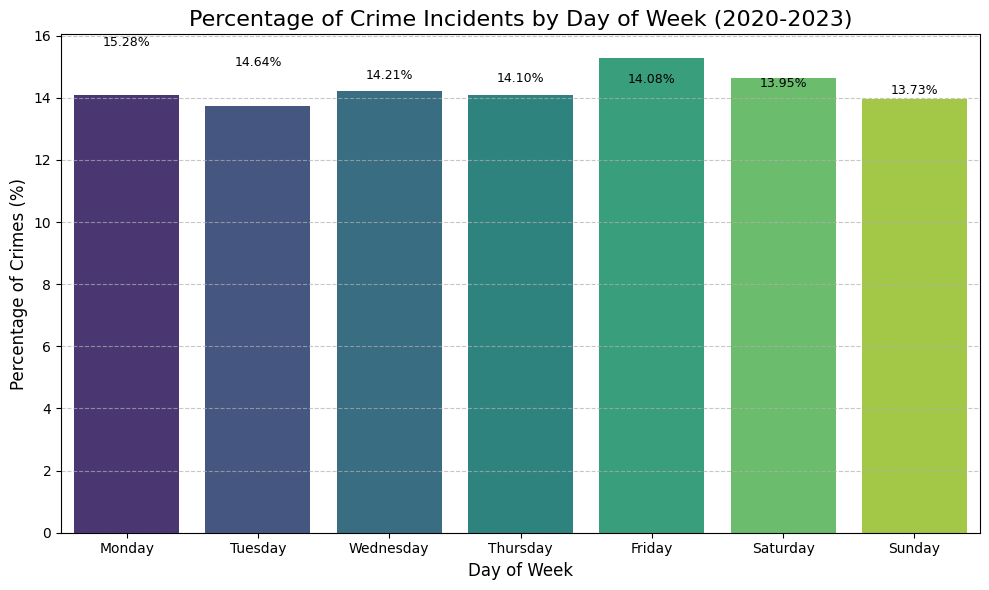


--- Bar Chart for Day of Week Analysis Generated ---


In [53]:
# Visualize the distribution of crime incidents by Day of Week.
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd # Ensure pandas is imported if not already

print("--- Generating Bar Chart for Crime Incidents by Day of Week ---")

plt.figure(figsize=(10, 6)) # Adjust figure size for good readability

# Create a bar plot using the ordered percentages
# The x-axis order will be maintained because day_of_week_percentages' index is an ordered categorical.
sns.barplot(
    x=day_of_week_percentages.index, # Day of week on x-axis (already ordered)
    y=day_of_week_percentages.values, # Percentage values on y-axis
    hue=day_of_week_percentages.index, # Explicitly use x-axis categories for coloring
    palette='viridis', # A good general-purpose color palette
    legend=False # Suppress the redundant legend
)

# Add titles and labels
plt.title('Percentage of Crime Incidents by Day of Week (2020-2023)', fontsize=16)
plt.xlabel('Day of Week', fontsize=12)
plt.ylabel('Percentage of Crimes (%)', fontsize=12)

# Add percentages on top of the bars for exact values
for index, value in enumerate(day_of_week_percentages.values):
    plt.text(
        index,
        value + 0.3, # Position the text slightly above the bar
        f'{value:.2f}%', # Format to two decimal places
        ha='center', # Center the text horizontally
        va='bottom', # Align vertically at the bottom
        fontsize=9
    )

# Add a grid for easier reading of values
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Improve layout to prevent labels/titles from overlapping
plt.tight_layout()

# Display the plot
plt.show()

print("\n--- Bar Chart for Day of Week Analysis Generated ---")